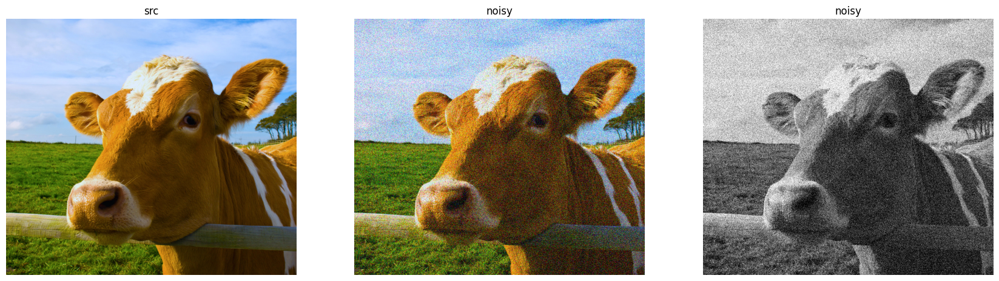

In [1]:
import cv2
import numpy as np
from utils import show_images

rgb_img = cv2.imread('./image/cow.jpg')
gauss = np.random.normal(0, 40, rgb_img.shape)
noisy_rgb_img = rgb_img + gauss
noisy_rgb_img = noisy_rgb_img.clip(0, 255).astype(np.uint8)

gray_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)
gauss = np.random.normal(0, 40, gray_img.shape)
noisy_gray_img = gray_img + gauss
noisy_gray_img = noisy_gray_img.clip(0, 255).astype(np.uint8)

show_images([('src', rgb_img), ('noisy', noisy_rgb_img), ('noisy', noisy_gray_img)])

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def metrics(raw_img, new_img):
    x1 = raw_img[10:-10, 10:-10]
    x2 = new_img[10:-10, 10:-10]

    if x1.max() > 1: x1 = (x1.astype(np.uint8) / 255)
    if x2.max() > 1: x2 = (x2.astype(np.uint8) / 255)

    mse = np.mean((x1-x2) ** 2)
    return 1000 if mse==0 else 10*np.log(1/mse)


def draw_denoising(src_img, recover_imgs, titles, figsize=(24, 24)):
    # compute_psnr
    psnrs = np.round(np.array([metrics(src_img, x) for x in recover_imgs]), 2)

    rownum, colnum = 1, len(recover_imgs)

    _, axes = plt.subplots(rownum, colnum, figsize=figsize)
    axes = axes.reshape(rownum, colnum)

    for idx, img in enumerate(recover_imgs):
        axes[0, idx].set_axis_off()
        axes[0, idx].set_title(f'{titles[idx]}\npsnr = {psnrs[idx]}')

        if len(img.shape) > 2:
            axes[0, idx].imshow(img[..., ::-1])
        else:
            axes[0, idx].imshow(img, cmap="gray")

    max_idx = np.argmax(psnrs)
    axes[0, max_idx].set_axis_on()
    for spine in axes[0, max_idx].spines.values():
        spine.set_edgecolor('red')
        spine.set_linewidth(3)

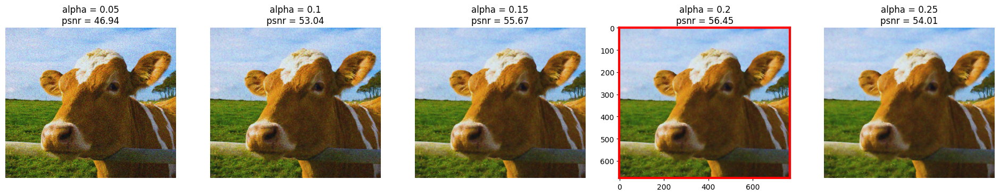

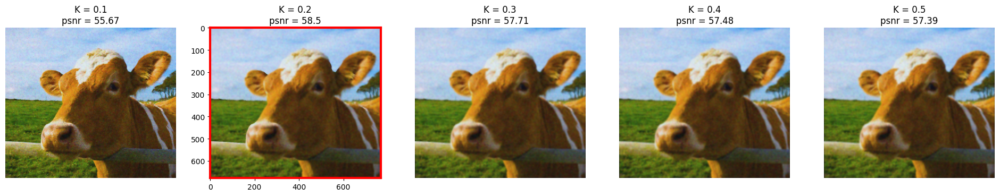

In [5]:
# anisotropic diffusion

titles, result = [], []
for i in range(1, 6, 1):
    now_img = cv2.ximgproc.anisotropicDiffusion(noisy_rgb_img, alpha=i/20, K=0.1, niters=10)
    result.append(now_img)
    titles.append(f'alpha = {i/20}')
draw_denoising(rgb_img, result, titles)

titles, result = [], []
for i in range(1, 6, 1):
    now_img = cv2.ximgproc.anisotropicDiffusion(noisy_rgb_img, alpha=0.15, K=i/10, niters=10)
    result.append(now_img)
    titles.append(f'K = {i/10}')
draw_denoising(rgb_img, result, titles)

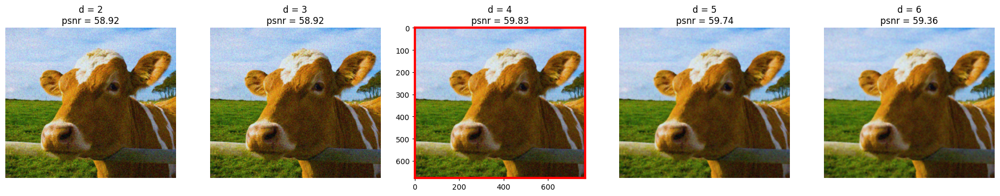

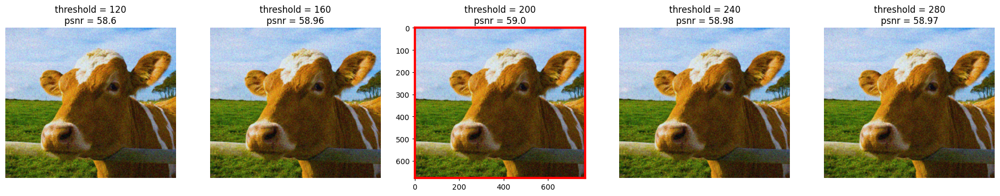

In [7]:
# EdgePreserving
titles, result = [], []
for i in range(2, 7, 1):
    now_img = cv2.ximgproc.edgePreservingFilter(noisy_rgb_img, d=i, threshold=150)
    result.append(now_img)
    titles.append(f'd = {i}')
draw_denoising(rgb_img, result, titles)

titles, result = [], []
for i in range(1, 10, 2):
    now_img = cv2.ximgproc.edgePreservingFilter(noisy_rgb_img, d=3, threshold=100+20*i)
    result.append(now_img)
    titles.append(f'threshold = {100+20*i}')
draw_denoising(rgb_img, result, titles)

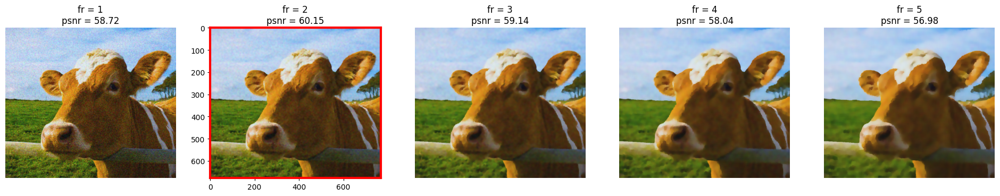

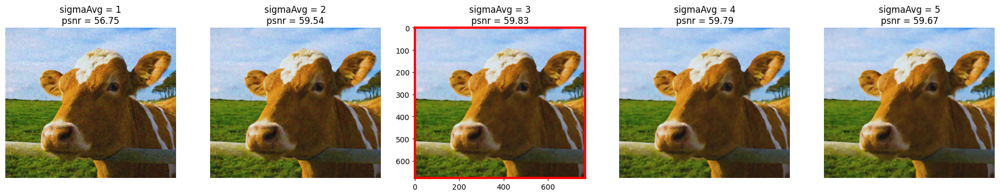

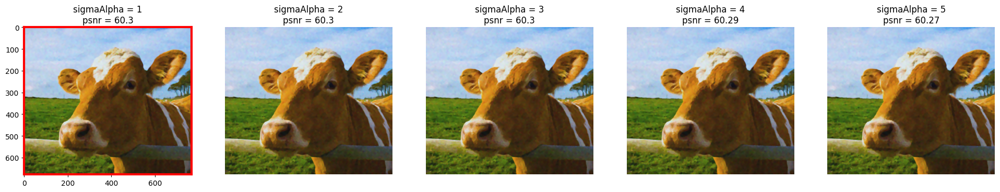

In [9]:
# bilateralTextureFilter
titles, result = [], []
for i in range(1, 6, 1):
    # simgaAlpha, sigmaAvg: When the value is negative, it is automatically calculated.
    now_img = cv2.ximgproc.bilateralTextureFilter(noisy_rgb_img, fr=i, numIter=1, sigmaAlpha=-1, sigmaAvg=-1)
    result.append(now_img)
    titles.append(f'fr = {i}')
draw_denoising(rgb_img, result, titles)

titles, result = [], []
# sigmaAvg: Range blur parameter for texture blurring. Larger -> More blurred.
for i in range(1, 6, 1):
    now_img = cv2.ximgproc.bilateralTextureFilter(noisy_rgb_img, fr=3, numIter=1, sigmaAlpha=-1, sigmaAvg=i/100)
    result.append(now_img)
    titles.append(f'sigmaAvg = {i}')
draw_denoising(rgb_img, result, titles)

titles, result = [], []
# sigmaAlpha: Controls the sharpness of the weight transition from edges to smooth/texture regions. Larger -> Shaper
for i in range(1, 6, 1):
    now_img = cv2.ximgproc.bilateralTextureFilter(noisy_rgb_img, fr=3, numIter=1, sigmaAlpha=i, sigmaAvg=0.04)
    result.append(now_img)
    titles.append(f'sigmaAlpha = {i}')
draw_denoising(rgb_img, result, titles)

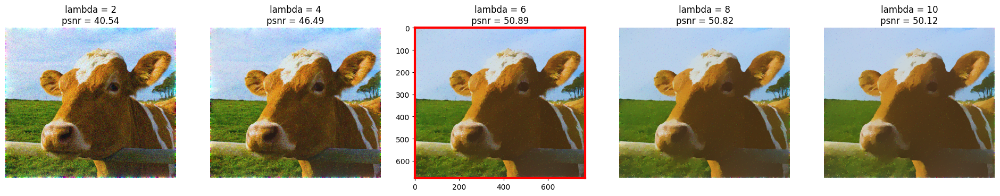

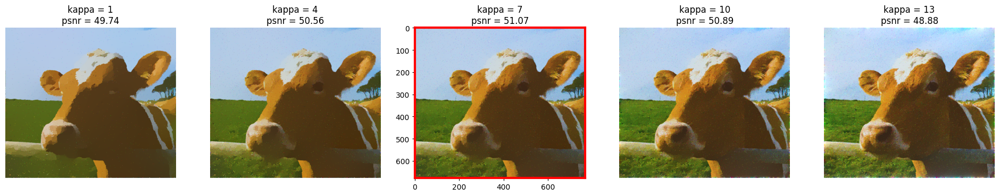

In [12]:
# l0Smooth
titles, result = [], []
for i in range(2, 11, 2):
    now_img = cv2.ximgproc.l0Smooth(noisy_rgb_img, lambda_=i/100, kappa=2.0)
    result.append(now_img)
    titles.append(f'lambda = {i}')
draw_denoising(rgb_img, result, titles)

titles, result = [], []
for i in range(1, 15, 3):
    now_img = cv2.ximgproc.l0Smooth(noisy_rgb_img, lambda_=6/100, kappa=1+i/10)
    result.append(now_img)
    titles.append(f'kappa = {i}')
draw_denoising(rgb_img, result, titles)